In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
import time
from tqdm import tqdm

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

import tensorflow as tf
import keras
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.5
keras.backend.set_session(tf.Session(config=config))
import segmentation_models as sm


Bad key "text.kerning_factor" on line 4 in
/home/ruslan/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution
/home/ruslan/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/ruslan/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/ruslan/.local/lib/python3.6/site-packages/tensorflow/python/fr

Segmentation Models: using `keras` framework.


In [2]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    
# helper function for data visualization    
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)    
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x

### Sidewalk segmentation model definition

In [3]:
BACKBONE = 'efficientnetb3'

#create model
model = sm.Unet(BACKBONE, classes=1, activation='sigmoid')
model.load_weights('unet-efficientnetb3-berkeley-drivable-sidewalk-192x320.h5')

In [4]:
preprocess_input = sm.get_preprocessing(BACKBONE)
def image_preprocessing(image, size=(192, 320)):
    # convert color
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # apply preprocessing
    image = cv2.resize(image, (size[1], size[0]), cv2.INTER_LINEAR)
    image = preprocess_input(image)
    img_processed = np.expand_dims(image, axis=0)
    return img_processed

### Model testing and visualization

In [5]:
def visual_seg_result(image, seg_mask):
    # Generate fake R & B color dimensions, stack with G
    size = (seg_mask[0].shape[:2])
    blanks = np.zeros(size).astype(np.uint8)
    lane_drawn = np.dstack((blanks, seg_mask[0], blanks))

    # # Re-size to match the original image
    lane_image = cv2.resize(lane_drawn, (image.shape[1], image.shape[0]))

    # Merge the lane drawing onto the original image
    result = 0.7* denormalize(frame_raw) + 0.3 * lane_image
    return result

  0%|          | 0/19 [00:00<?, ?it/s]


[INFO] single frame of size (192, 320) took 2.9308 seconds


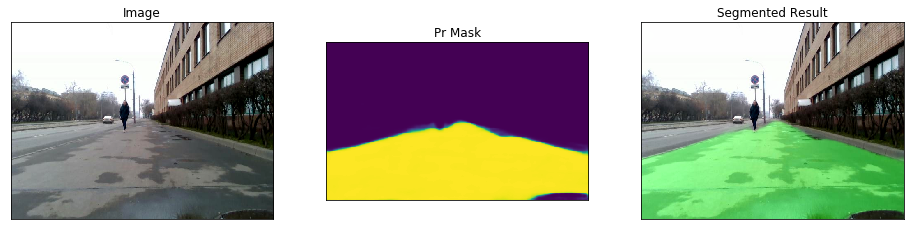

  5%|▌         | 1/19 [00:03<00:56,  3.15s/it]

[INFO] single frame of size (192, 320) took 0.0134 seconds


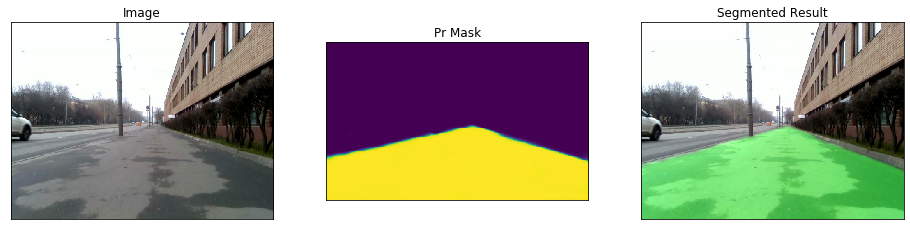

 11%|█         | 2/19 [00:03<00:38,  2.28s/it]

[INFO] single frame of size (192, 320) took 0.0138 seconds


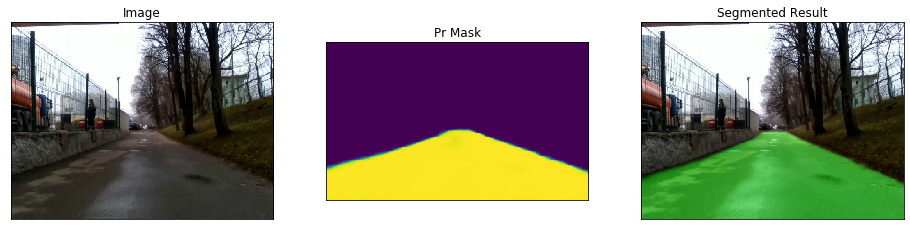

 16%|█▌        | 3/19 [00:03<00:27,  1.70s/it]

[INFO] single frame of size (192, 320) took 0.0133 seconds


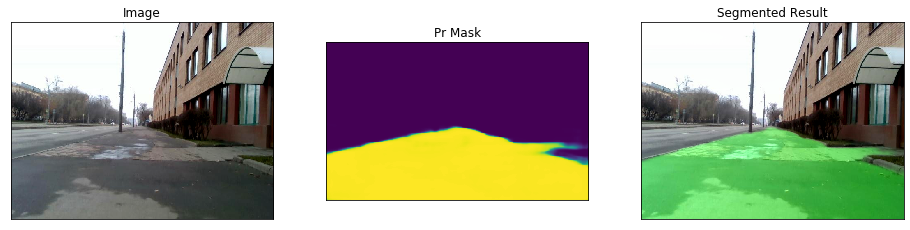

 21%|██        | 4/19 [00:03<00:18,  1.25s/it]

[INFO] single frame of size (192, 320) took 0.0133 seconds


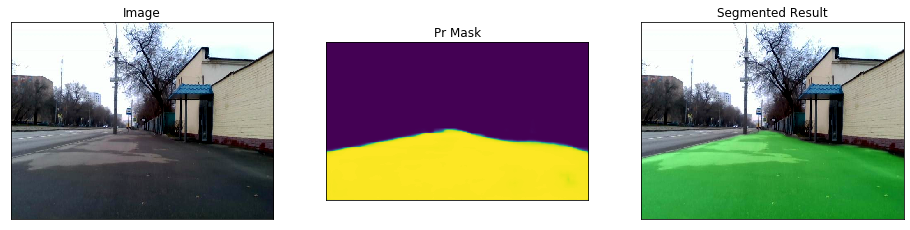

 26%|██▋       | 5/19 [00:04<00:13,  1.05it/s]

[INFO] single frame of size (192, 320) took 0.0141 seconds


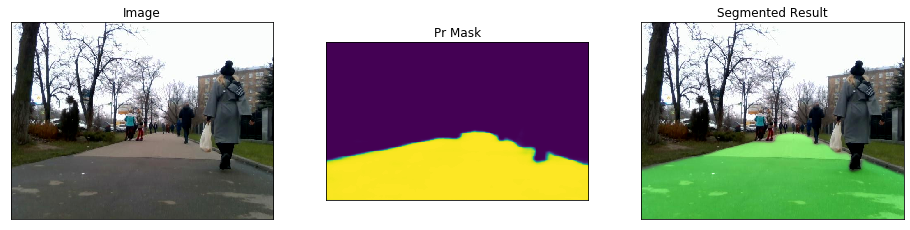

 32%|███▏      | 6/19 [00:04<00:09,  1.36it/s]

[INFO] single frame of size (192, 320) took 0.0130 seconds


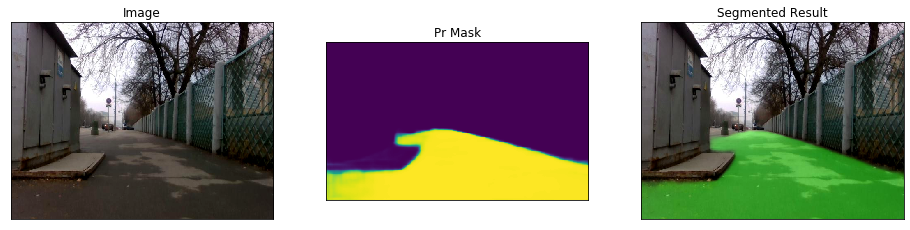

 37%|███▋      | 7/19 [00:04<00:07,  1.71it/s]

[INFO] single frame of size (192, 320) took 0.0131 seconds


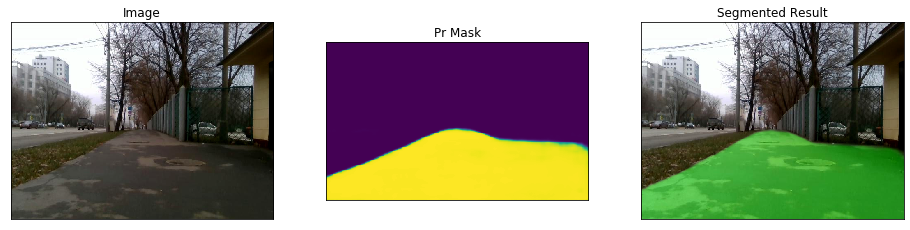

 42%|████▏     | 8/19 [00:04<00:05,  2.08it/s]

[INFO] single frame of size (192, 320) took 0.0150 seconds


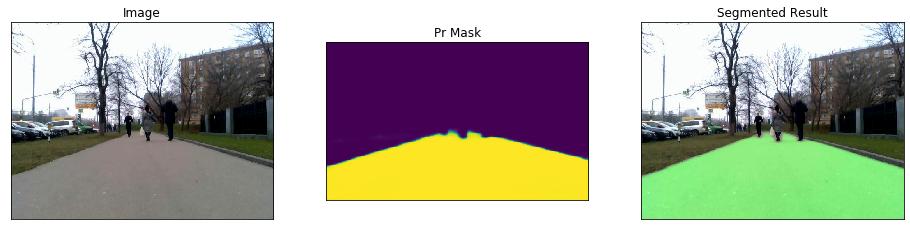

 47%|████▋     | 9/19 [00:05<00:04,  2.46it/s]

[INFO] single frame of size (192, 320) took 0.0152 seconds


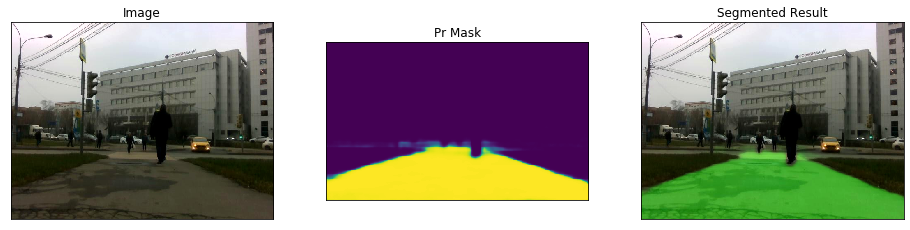

 53%|█████▎    | 10/19 [00:05<00:03,  2.84it/s]

[INFO] single frame of size (192, 320) took 0.0158 seconds


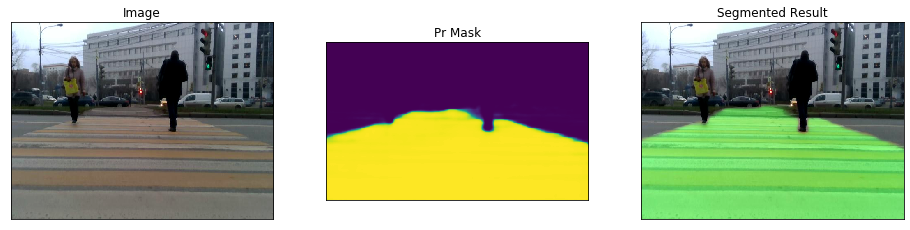

 58%|█████▊    | 11/19 [00:05<00:02,  3.16it/s]

[INFO] single frame of size (192, 320) took 0.0155 seconds


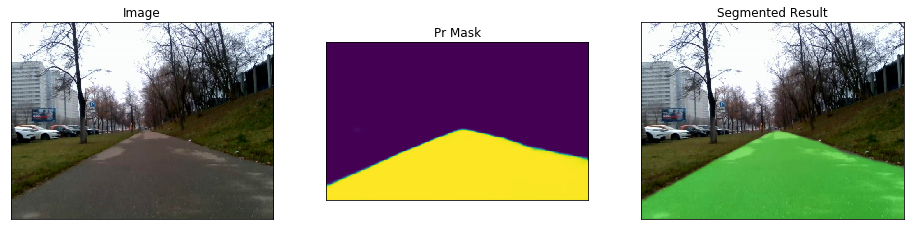

 63%|██████▎   | 12/19 [00:05<00:02,  3.46it/s]

[INFO] single frame of size (192, 320) took 0.0148 seconds


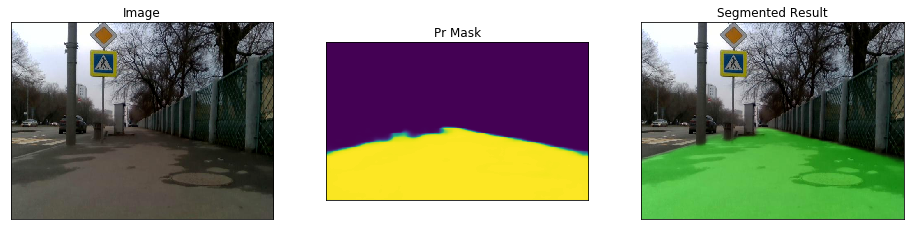

 68%|██████▊   | 13/19 [00:06<00:01,  3.66it/s]

[INFO] single frame of size (192, 320) took 0.0149 seconds


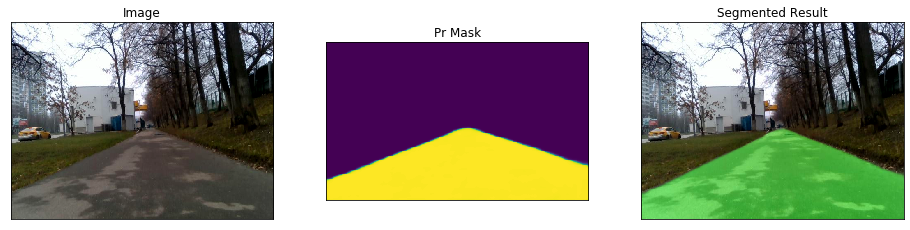

 74%|███████▎  | 14/19 [00:06<00:01,  3.84it/s]

[INFO] single frame of size (192, 320) took 0.0148 seconds


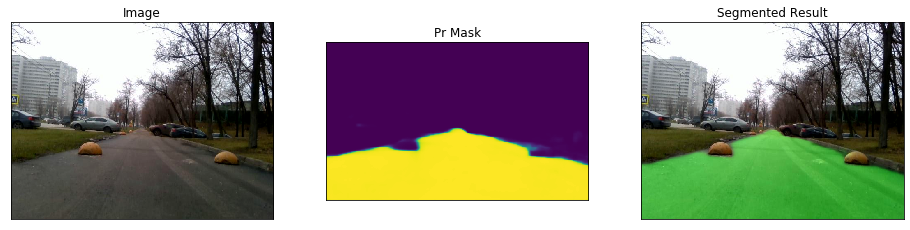

 79%|███████▉  | 15/19 [00:06<00:01,  3.94it/s]

[INFO] single frame of size (192, 320) took 0.0153 seconds


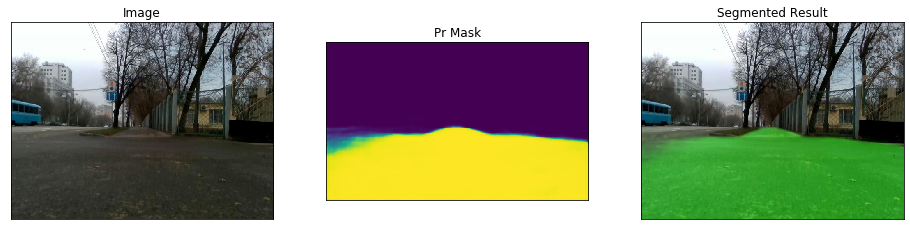

 84%|████████▍ | 16/19 [00:06<00:00,  4.00it/s]

[INFO] single frame of size (192, 320) took 0.0153 seconds


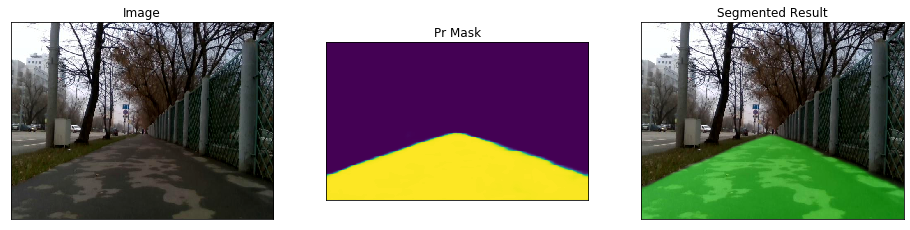

 89%|████████▉ | 17/19 [00:06<00:00,  4.07it/s]

[INFO] single frame of size (192, 320) took 0.0150 seconds


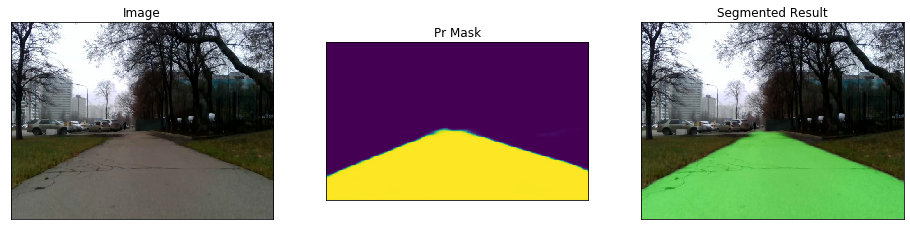

 95%|█████████▍| 18/19 [00:07<00:00,  4.14it/s]

[INFO] single frame of size (192, 320) took 0.0151 seconds


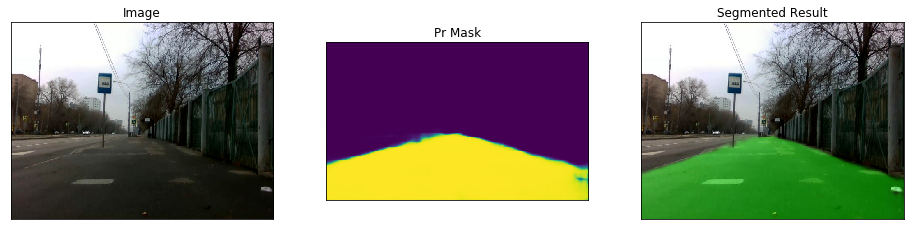

100%|██████████| 19/19 [00:07<00:00,  2.55it/s]

[INFO] Mean FPS 65.6705 Hz


In [6]:
PATH_TO_FRAMES = 'images'
FPS = []
for im_path in tqdm( os.listdir(PATH_TO_FRAMES) ):
    # get raw frames from video stream
    frame_raw = cv2.imread(os.path.join(PATH_TO_FRAMES, im_path))
    
    # preprocess raw frames
    frame = image_preprocessing(frame_raw)
    # predict segmentation mask from the frame
    start = time.time()
    pr_mask = model.predict(frame)
    end = time.time()
    dt = end-start
    FPS.append(1./dt)
    segmented_result = visual_seg_result(frame_raw[:,:,(2,1,0)], pr_mask)
    print("[INFO] single frame of size {} took {:.4f} seconds".format(frame.shape[1:3], dt))

    plt.figure(figsize=(16,5))
    visualize(
        image=denormalize(frame_raw[:,:,(2,1,0)]),
        pr_mask=pr_mask.squeeze(),
        segmented_result=denormalize(segmented_result[...,(2,1,0)])
    )
    plt.show()

print("[INFO] Mean FPS {:.4f} Hz".format(np.mean(FPS)))


### Extracting a contour from segmented results

In [7]:
def get_binary(pr_mask):
    mask = pr_mask.squeeze()
    blurred = cv2.GaussianBlur(mask, (5, 5), 0)
    mask255 = np.array(255*denormalize(blurred), dtype=np.uint8)
    _, thresh255 = cv2.threshold(mask255, np.mean(mask255), np.max(mask255), cv2.THRESH_BINARY)
    binary_mask = np.array( 1 - denormalize(thresh255), dtype=np.int )
    return binary_mask

In [8]:
import imutils
def get_contour(binary_mask):
    thresh = np.array(255*(1-binary_mask), dtype=np.uint8)

    # find contours in the thresholded image
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    contour = sorted(cnts, key = cv2.contourArea, reverse=True)[0] # keep only the largest contour
    return contour

### Artificial Potential Fields (APF) planner

In [9]:
def gradient_planner(f, start_coords, end_coords, max_its):
    '''
    This function plans a path through a 2D
    environment from a start to a destination based on the gradient of the
    function f which is passed in as a 2D array. The two arguments
    start_coords and end_coords denote the coordinates of the start and end
    positions respectively in the array while max_its indicates an upper
    bound on the number of iterations that the system can use before giving
    up.
    The output, route, is an array with 2 columns and n rows where the rows
    correspond to the coordinates of the robot as it moves along the route.
    The first column corresponds to the x coordinate and the second to the y coordinate
    '''

    [gy, gx] = np.gradient(-f)

    route = np.vstack( [np.array(start_coords), np.array(start_coords)] )
    for i in range(max_its):
        current_point = route[-1,:]
        # print(sum( abs(current_point-end_coords) ))
        if sum( abs(current_point-end_coords) ) < 5.0:
            print('Reached the goal !')
            break
        ix = int(round( current_point[1] ))
        iy = int(round( current_point[0] ))
        vx = gx[ix, iy]
        vy = gy[ix, iy]
        dt = 1 / np.linalg.norm([vx, vy])
        next_point = current_point + dt*np.array( [vx, vy] )
        route = np.vstack( [route, next_point] )
    route = route[1:,:]
        
    return route

In [10]:
from scipy.ndimage.morphology import distance_transform_edt as bwdist
def APF_route(binary_mask, goal):
    """
    compute route from a mask (and a goal pose)
    """
    # get repulsive potential
    d = bwdist(binary_mask==0)
    d2 = (d/100.) + 1 # Rescale and transform distances
    d0 = 1.2
    nu = 800
    repulsive = nu*((1./d2 - 1/d0)**2)
    repulsive [d2 > d0] = 0

    # get attractive potential
    start = [160, 190];
    nrows, ncols = binary_mask.shape
    [x, y] = np.meshgrid (np.arange(ncols), np.arange(nrows));
    xi = 1/700.
    attractive = xi * ( (x - goal[0])**2 + (y - goal[1])**2 )

    # Combined potential
    f = attractive + repulsive

    route = gradient_planner(f, start, goal, 700)
    return route

In [11]:
def goal_from_mask(binary_mask):
    drivable_indexes = np.asarray( np.where(binary_mask==0) )
    farest_y = np.min(drivable_indexes[0,:])
    farest_id = np.where(drivable_indexes[0,:]==farest_y)[0][0]
    farest_x = drivable_indexes[1, farest_id]

    farest_x += 5
    farest_y += 5
    goal = [farest_x, farest_y]
    return goal

### Computing velocity commands from road segmentation mask

In [12]:
def get_commands(binary_mask, route):
    _, w = binary_mask.shape
    route_int = np.asarray(route, dtype=np.int)
    m = route_int[:,0]
    h = np.max(route_int[:,1]) - np.min(route_int[:,1])

#     beta = 0.001
#     omega = beta * np.sum(w/2 - m)
    beta = 0.01
    omega = beta * np.mean(m - w/2)

    alpha = 0.02
    vel = alpha * h - np.abs(omega)
    
    return vel, omega

Velocity 1.46 [m/s]
Omega 0.06 [rad/s]


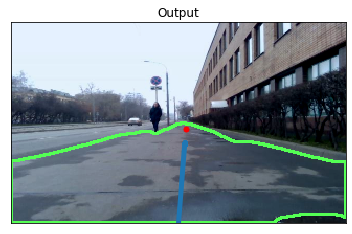

Velocity 1.24 [m/s]
Omega 0.16 [rad/s]


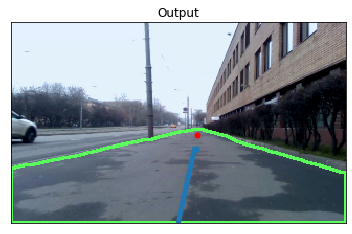

Velocity 1.34 [m/s]
Omega 0.00 [rad/s]


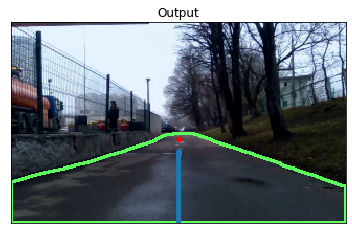

Velocity 1.39 [m/s]
Omega -0.01 [rad/s]


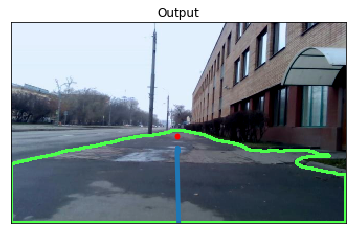

Velocity 1.24 [m/s]
Omega -0.10 [rad/s]


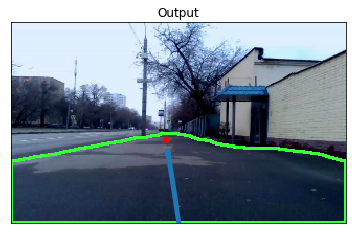

Velocity 1.10 [m/s]
Omega 0.20 [rad/s]


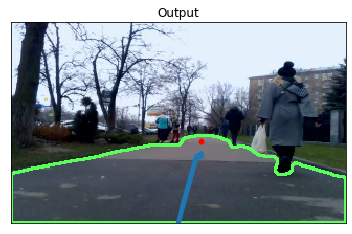

Velocity 1.11 [m/s]
Omega -0.23 [rad/s]


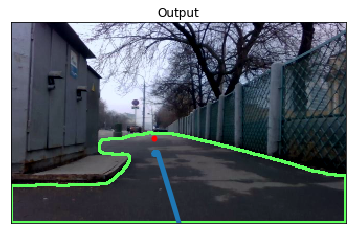

Velocity 1.32 [m/s]
Omega -0.02 [rad/s]


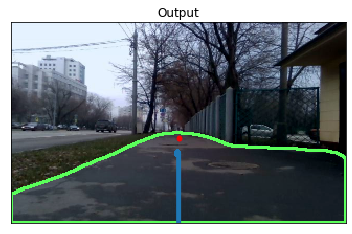

Velocity 1.15 [m/s]
Omega -0.09 [rad/s]


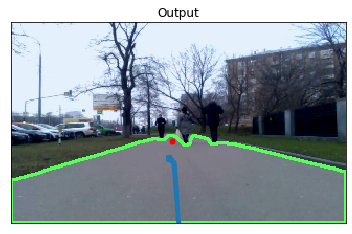

Velocity 0.69 [m/s]
Omega -0.27 [rad/s]


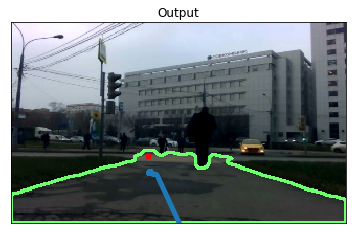

Velocity 1.75 [m/s]
Omega -0.07 [rad/s]


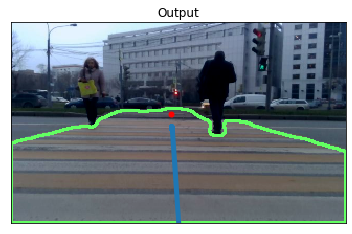

Velocity 1.28 [m/s]
Omega 0.06 [rad/s]


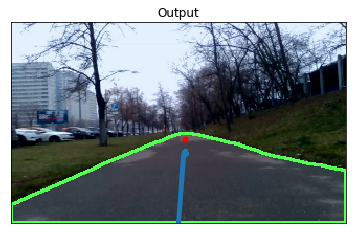

Velocity 1.30 [m/s]
Omega -0.08 [rad/s]


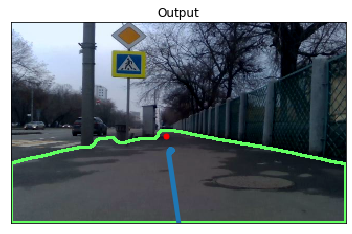

Velocity 1.28 [m/s]
Omega 0.10 [rad/s]


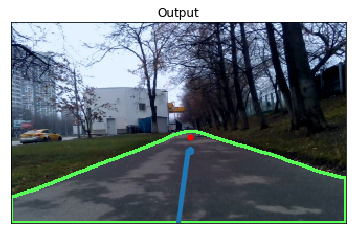

Velocity 1.35 [m/s]
Omega -0.01 [rad/s]


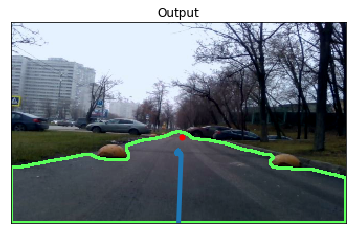

Velocity 1.33 [m/s]
Omega -0.07 [rad/s]


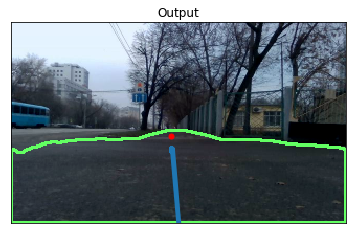

Velocity 1.24 [m/s]
Omega -0.02 [rad/s]


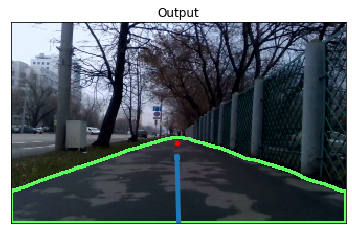

Velocity 1.20 [m/s]
Omega -0.14 [rad/s]


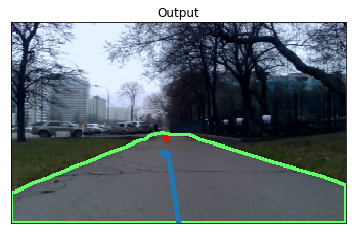

Velocity 1.02 [m/s]
Omega -0.20 [rad/s]


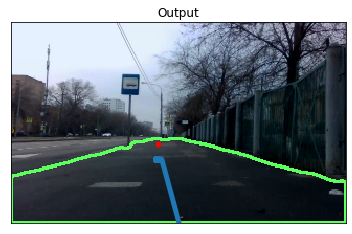

In [13]:
PATH_TO_IMAGES = 'images'
# PATH_TO_IMAGES = '/home/rus/Desktop/SelfDrivingCar/robot_scene_understanding/Sidewalk_segmentation/sidewalk_dataset/images/train/'
# PATH_TO_IMAGES = '/home/rus/Desktop/SelfDrivingCar/robot_scene_understanding/Sidewalk_segmentation/sidewalk_dataset/images/val/'

for im_path in os.listdir(PATH_TO_IMAGES):
    # get raw frames from video stream
    frame_raw = cv2.imread(os.path.join(PATH_TO_IMAGES, im_path))
    
    # preprocess raw frames
    frame = image_preprocessing(frame_raw)
    # predict segmentation mask from the frame
    pr_mask = model.predict(frame)
    
    # get binary mask
    binary_mask = get_binary(pr_mask)
    
    # get contour from segmented result
    contour = get_contour(binary_mask)
    
    # get route from APF
    goal = goal_from_mask(binary_mask)
    route = APF_route(binary_mask, goal)
    
    vel, omega = get_commands(binary_mask, route)
    print('Velocity {:.2f} [m/s]'.format(vel))
    print('Omega {:.2f} [rad/s]'.format(omega))
    
    """VISUALIZATION"""
    plt.figure()
    # draw the contour and center of the shape on the image
    image = frame[0].copy()
    cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)
    # show the image
    visualize(output=denormalize(image))
    plt.plot(route[:,0], route[:,1], linewidth=5)
    plt.plot(goal[0], goal[1], 'ro', markersize=5)
    plt.show()

### Compute middle contours route instead of APF

In [14]:
def get_middle_route(binary_mask):
    drivable_indexes = np.asarray( np.where(binary_mask==0) )
    farest_y = np.min(drivable_indexes[0,:])

    h = binary_mask.shape[0]
    middle_route = []
    for i in range(farest_y, h-2):
        road_horizontal_slice = np.asarray( np.where(binary_mask[i,:]==0) ).squeeze()
        try: # road_horizontal_slice could be empty or single number
            left_x = np.min(road_horizontal_slice)
            right_x = np.max(road_horizontal_slice)
            m_i = np.mean([left_x, right_x])
            middle_route.append([m_i, i])
        except:
            pass
    middle_route = np.array(middle_route)
    
    return middle_route

Velocity 1.83 [m/s]
Omega -0.03 [rad/s]


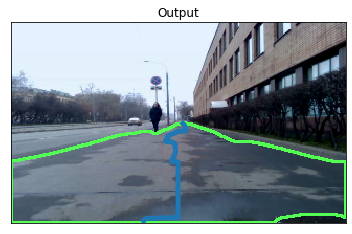

Velocity 1.73 [m/s]
Omega 0.01 [rad/s]


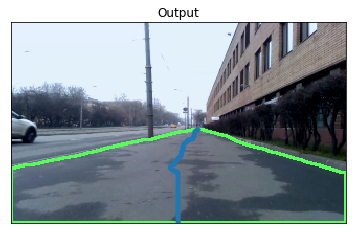

Velocity 1.66 [m/s]
Omega -0.00 [rad/s]


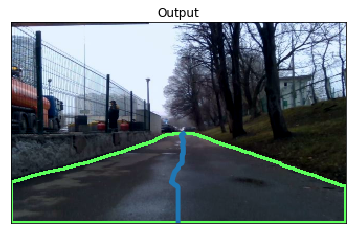

Velocity 1.68 [m/s]
Omega -0.04 [rad/s]


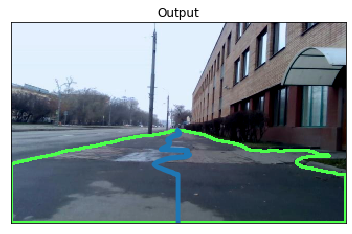

Velocity 1.64 [m/s]
Omega -0.02 [rad/s]


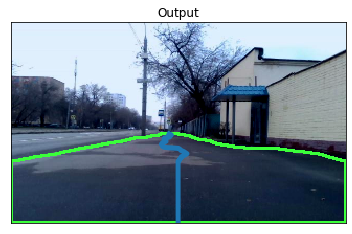

Velocity 1.60 [m/s]
Omega 0.02 [rad/s]


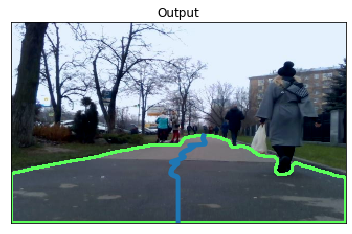

Velocity 1.61 [m/s]
Omega 0.07 [rad/s]


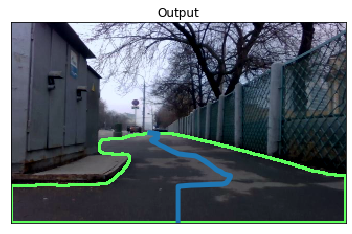

Velocity 1.55 [m/s]
Omega 0.13 [rad/s]


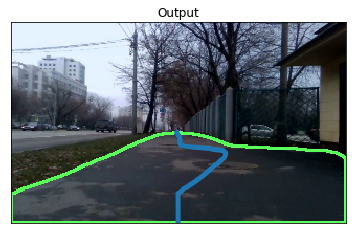

Velocity 1.59 [m/s]
Omega 0.03 [rad/s]


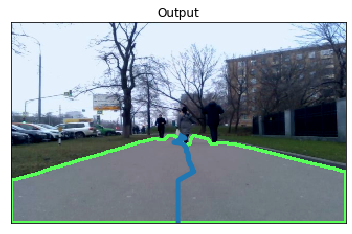

Velocity 1.28 [m/s]
Omega -0.06 [rad/s]


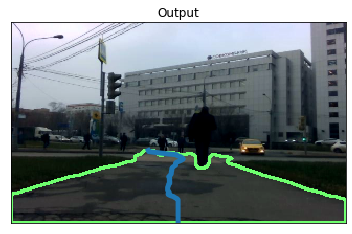

Velocity 2.08 [m/s]
Omega -0.06 [rad/s]


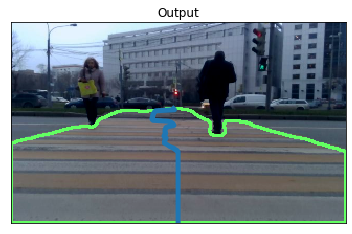

Velocity 1.51 [m/s]
Omega 0.15 [rad/s]


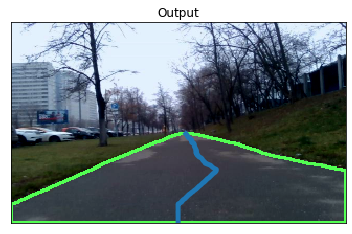

Velocity 1.69 [m/s]
Omega -0.03 [rad/s]


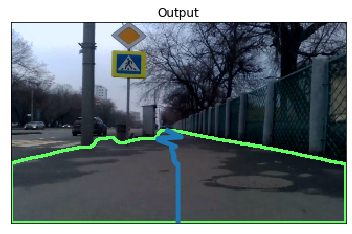

Velocity 1.59 [m/s]
Omega 0.11 [rad/s]


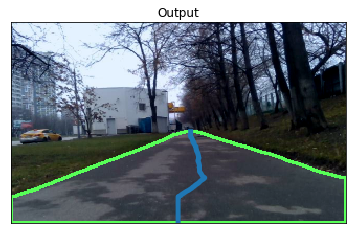

Velocity 1.66 [m/s]
Omega -0.04 [rad/s]


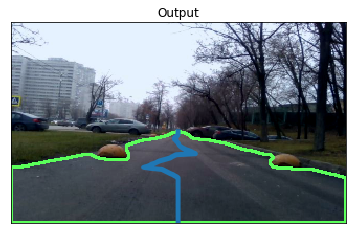

Velocity 1.70 [m/s]
Omega -0.02 [rad/s]


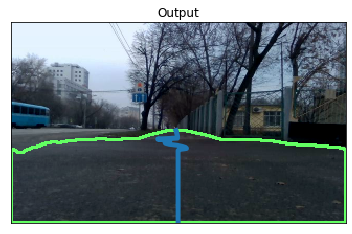

Velocity 1.57 [m/s]
Omega -0.01 [rad/s]


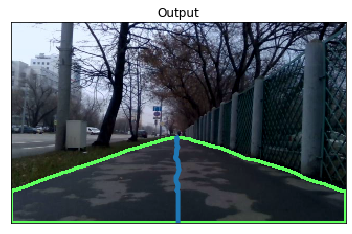

Velocity 1.68 [m/s]
Omega -0.00 [rad/s]


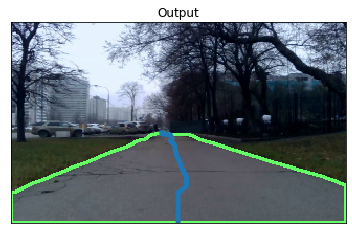

Velocity 1.50 [m/s]
Omega -0.06 [rad/s]


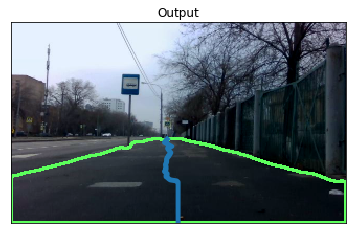

In [15]:
PATH_TO_IMAGES = 'images'
# PATH_TO_IMAGES = '/home/rus/Desktop/SelfDrivingCar/robot_scene_understanding/Sidewalk_segmentation/sidewalk_dataset/images/train/'
# PATH_TO_IMAGES = '/home/rus/Desktop/SelfDrivingCar/robot_scene_understanding/Sidewalk_segmentation/sidewalk_dataset/images/val/'

for im_path in os.listdir(PATH_TO_IMAGES):
    # get raw frames from video stream
    frame_raw = cv2.imread(os.path.join(PATH_TO_IMAGES, im_path))
    
    # preprocess raw frames
    frame = image_preprocessing(frame_raw)
    # predict segmentation mask from the frame
    pr_mask = model.predict(frame)
    
    # get binary mask
    binary_mask = get_binary(pr_mask)
    
    # get contour from segmented result
    contour = get_contour(binary_mask)
    
    # compute middle contour route
    route = get_middle_route(binary_mask)
    
    vel, omega = get_commands(binary_mask, route)
    print('Velocity {:.2f} [m/s]'.format(vel))
    print('Omega {:.2f} [rad/s]'.format(omega))
    
    """VISUALIZATION"""
    plt.figure()
    # draw the contour and center of the shape on the image
    image = frame[0].copy()
    cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)
    # show the image
    visualize(output=denormalize(image))
    plt.plot(route[:,0], route[:,1], linewidth=5)
    plt.show()

### Construct a trajectory from video stream

In [16]:
def commands_from_roadframe(frame_raw):
    # preprocess raw frames
    frame = image_preprocessing(frame_raw)
    # predict segmentation mask from the frame
    pr_mask = model.predict(frame)
    
    # get binary mask
    binary_mask = get_binary(pr_mask)
    
    # compute middle contour route
    route = get_middle_route(binary_mask)
    
    vel, omega = get_commands(binary_mask, route)
    return vel, omega

In [17]:
class Params:
    def __init__(self):
        self.max_vel = 2.0 # m/s
        self.min_vel = 0.0 # m/s
        
params = Params()
        
def motion(state, vel, omega, dt, params=params):
    # state = [x(m), y(m), yaw(rad)]
    state[2] += dt*omega # yaw(rad)

    if vel >= params.max_vel: vel = params.max_vel
    if vel <= params.min_vel: vel = params.min_vel

    dv = dt*vel
    state[0] += dv*np.cos(state[2]) # x(m)
    state[1] += dv*np.sin(state[2]) # y(m)

    return state

  0%|          | 4/17297 [00:00<07:22, 39.06it/s]

[INFO] 17297 total frames in video


  6%|▌         | 998/17297 [00:20<05:28, 49.60it/s]

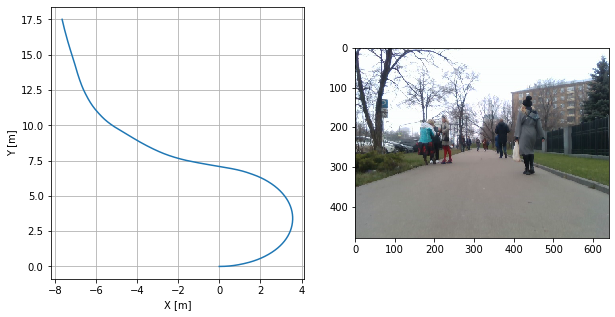

 12%|█▏        | 1997/17297 [00:40<05:14, 48.70it/s]

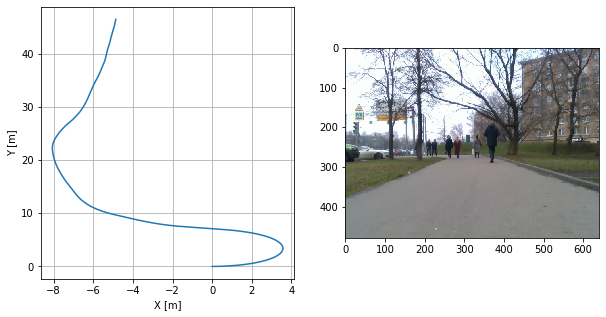

 17%|█▋        | 2997/17297 [01:00<04:50, 49.16it/s]

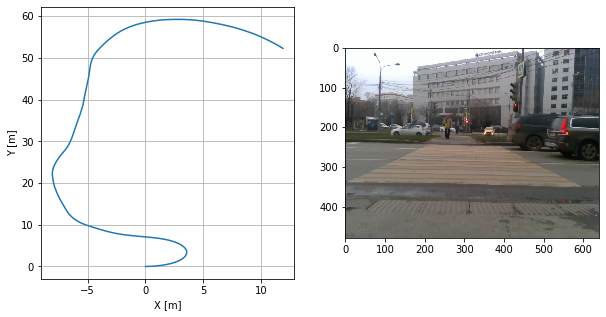

 23%|██▎       | 3999/17297 [01:21<04:30, 49.09it/s]

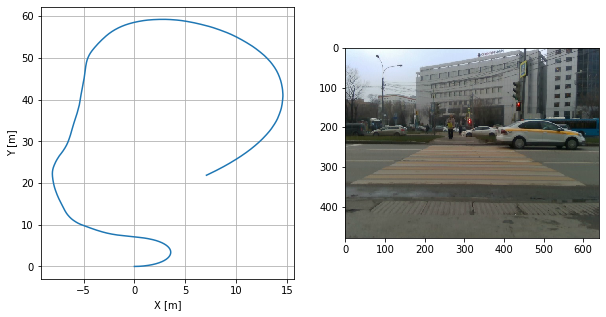

 29%|██▉       | 4996/17297 [01:42<04:07, 49.78it/s]

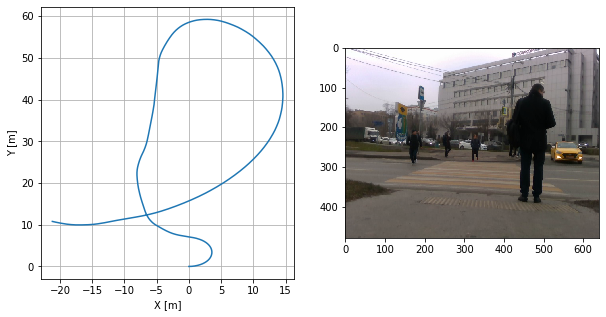

 35%|███▍      | 5996/17297 [02:02<03:49, 49.14it/s]

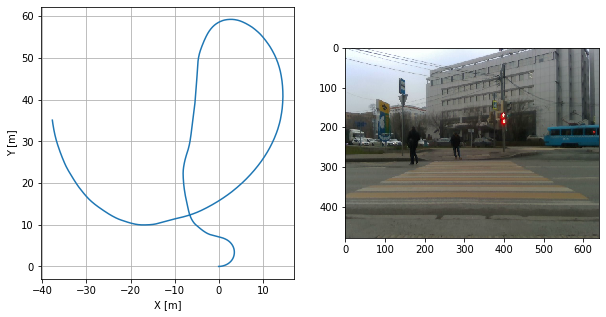

 40%|████      | 7000/17297 [02:23<03:21, 51.23it/s]

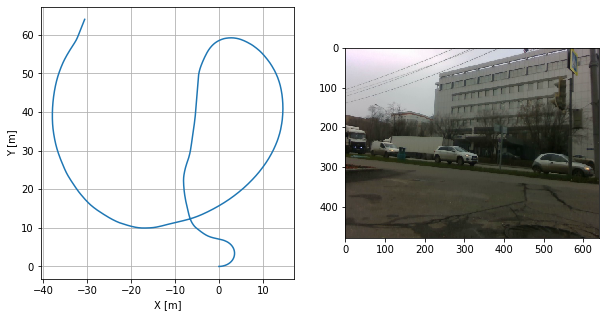

 46%|████▌     | 7995/17297 [02:43<03:08, 49.33it/s]

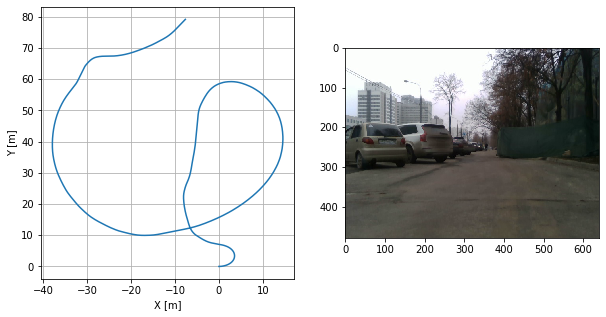

 52%|█████▏    | 9000/17297 [03:03<02:49, 49.02it/s]

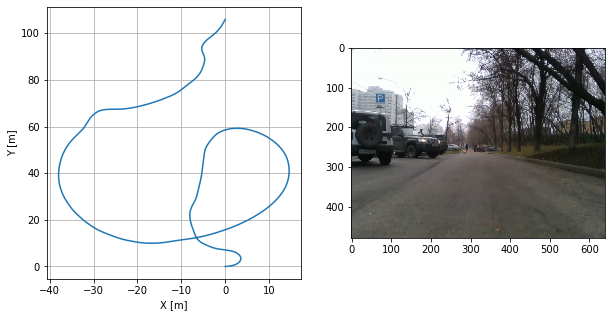

 58%|█████▊    | 9997/17297 [03:24<02:28, 49.24it/s]

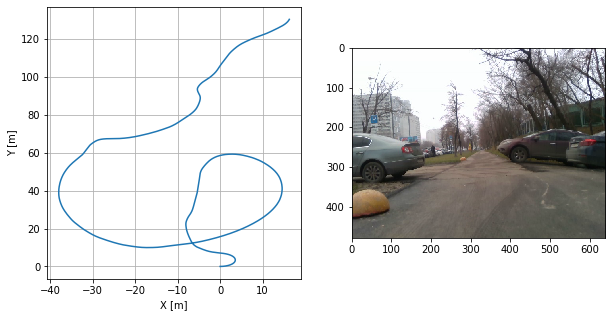

 64%|██████▎   | 10999/17297 [03:45<02:09, 48.45it/s]

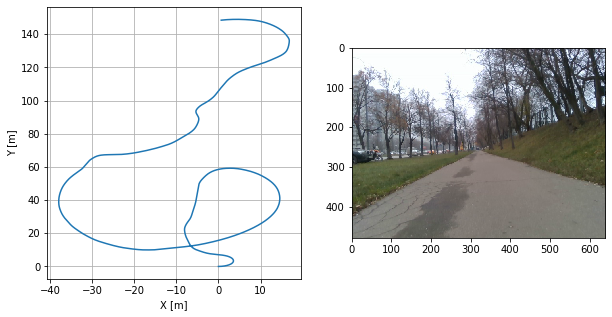

 69%|██████▉   | 11999/17297 [04:05<01:48, 49.01it/s]

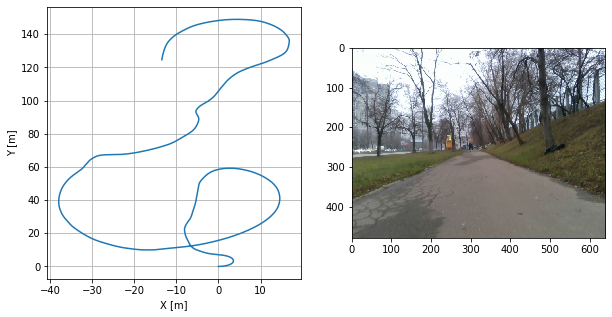

 75%|███████▌  | 13000/17297 [04:26<01:29, 48.25it/s]

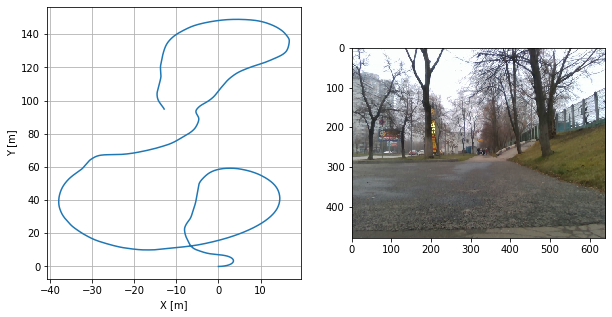

 81%|████████  | 13999/17297 [04:47<01:06, 49.56it/s]

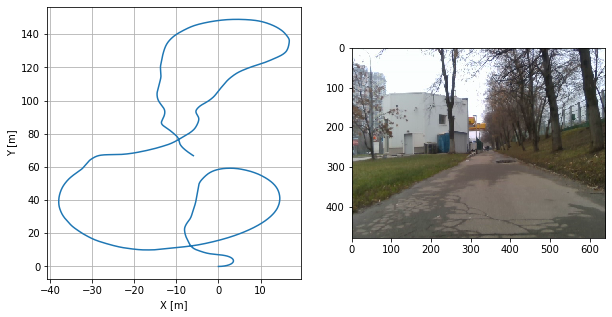

 87%|████████▋ | 14997/17297 [05:07<00:46, 49.32it/s]

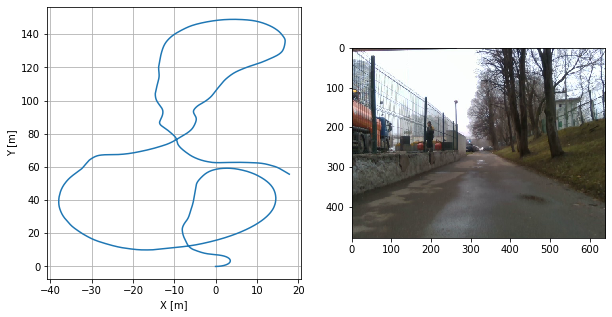

 92%|█████████▏| 15998/17297 [05:27<00:26, 49.91it/s]

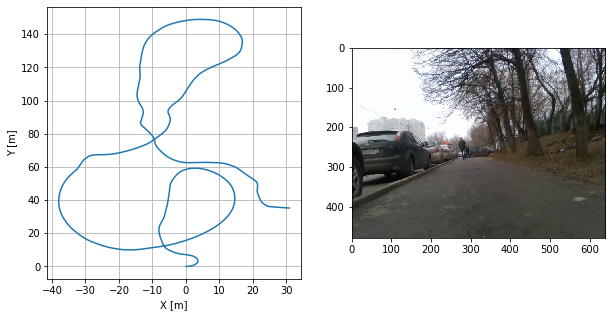

 98%|█████████▊| 17000/17297 [05:48<00:05, 50.34it/s]

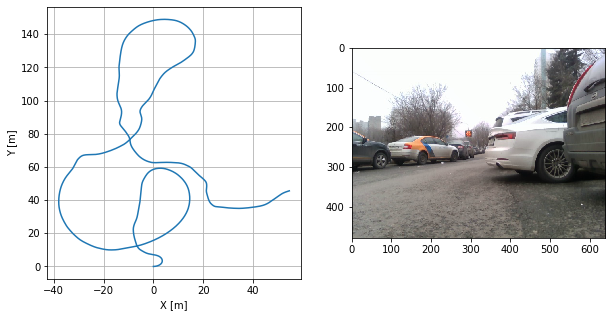

100%|██████████| 17297/17297 [05:54<00:00, 48.79it/s]

[INFO] Mean FPS 54.3899 Hz


In [25]:
PATH_TO_VIDEO = '/home/ruslan/Desktop/SelfDrivingCar/robot_scene_understanding/\
Semantic_Segmentation/Tensorflow_Deeplab_ModelZoo/way_back.avi'
vs = cv2.VideoCapture(PATH_TO_VIDEO)
size = (192, 320)

# try to determine the total number of frames in the video file
try:
    prop =  cv2.cv.CV_CAP_PROP_FRAME_COUNT if imutils.is_cv2() \
        else cv2.CAP_PROP_FRAME_COUNT
    total = int(vs.get(prop))
    print("[INFO] {} total frames in video".format(total))
# an error occurred while trying to determine the total
# number of frames in the video file
except:
    print("[INFO] could not determine # of frames in video")
    total = -1

FPS = []
state = np.array([0., 0., 0.]) # initial robot state
X = [state[0]]; Y = [state[1]]; Phi = [state[2]]

# while(1):
for i in tqdm( range(total) ):
# for i in tqdm( range(1000) ):
    # get raw frames from video stream
    ret, frame_raw = vs.read()
    if ret == False:
        break
    # get motion commands from raw frames    
    start = time.time()
    vel, omega = commands_from_roadframe(frame_raw)
    dt = time.time() - start
    FPS.append(1./dt)
    # print('Velocity {:.2f} [m/s], Omega {:.2f} [rad/s]'.format(vel, omega))
    
    # obtain robot's state from motion commands
    # these is a fake trajectory, only for test purpose
    state = motion(state, vel, omega, dt)
    X.append(state[0]); Y.append(state[1]); Phi.append(state[2])
    
    
    # Visualize resultant trajectory
    if i % 1000 == 0 and i!=0:
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1)
        plt.plot(X, Y)
        plt.grid()
        plt.xlabel('X [m]')
        plt.ylabel('Y [m]')
        
        plt.subplot(1,2,2)
        plt.imshow(frame_raw[...,(2,1,0)])
        plt.show()
    

print("[INFO] Mean FPS {:.4f} Hz".format(np.mean(FPS[1:])))